<a href="https://colab.research.google.com/github/BeltranMal/TA047R-2C2024-GRUPO01/blob/main/TA047R_TP1_GRUPO01_ENTREGA_EJ1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install plotly_express
import pandas as pd
from datetime import timedelta
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import pyarrow.parquet as pq
import scipy.stats as st
import scipy.linalg as la
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
informacion_zonas = pd.read_csv("/content/drive/MyDrive/TA047R-2C2024-GRUPO01/TLC Trip Record Data.csv")

In [ ]:
informacion_enero = pq.read_table("/content/drive/MyDrive/TA047R-2C2024-GRUPO01/yellow_tripdata_2023-01.parquet")
informacion_febrero = pq.read_table("/content/drive/MyDrive/TA047R-2C2024-GRUPO01/yellow_tripdata_2023-02.parquet")
informacion_marzo = pq.read_table("/content/drive/MyDrive/TA047R-2C2024-GRUPO01/yellow_tripdata_2023-03.parquet")
informacion_enero = informacion_enero.to_pandas()
informacion_febrero = informacion_febrero.to_pandas()
informacion_marzo = informacion_marzo.to_pandas()

In [ ]:
informacion_febrero = informacion_febrero.rename(columns={"Airport_fee": "airport_fee"})
informacion_marzo = informacion_marzo.rename(columns={"Airport_fee": "airport_fee"})

# Exploración Inicial

Analizar cada variable, considerando los siguientes aspectos.

● Variables Cuantitativas: calcular medidas de resumen, media, mediana, moda, etc.

● Variables Cualitativas: mostrar cantidad de valores posibles, y frecuencias de cada uno.

● Realizar un análisis gráfico de las distribuciones de las variables más relevantes

● Analizar las correlaciones existentes entre las variables.

In [ ]:
# Dataframe inicial completo
informacion_completa = pd.concat([informacion_enero, informacion_febrero, informacion_marzo])
informacion_completa["ViajeID"] = informacion_completa.index

In [ ]:
informacion_completa.VendorID = informacion_completa.VendorID.astype(np.int8)
informacion_completa.DOLocationID = informacion_completa.DOLocationID.astype(np.int16)
informacion_completa.PULocationID = informacion_completa.PULocationID.astype(np.int16)
informacion_completa.RatecodeID = informacion_completa.RatecodeID.astype(np.float16)
informacion_completa.payment_type = informacion_completa.payment_type.astype(np.int8)
informacion_completa.passenger_count = informacion_completa.passenger_count.astype(np.float32)
informacion_completa.airport_fee = informacion_completa.airport_fee.astype(np.float32)
informacion_completa.congestion_surcharge = informacion_completa.congestion_surcharge.astype(np.float32)
informacion_completa.improvement_surcharge = informacion_completa.improvement_surcharge.astype(np.float32)
informacion_completa.trip_distance = informacion_completa.trip_distance.astype(np.float32)
informacion_completa.fare_amount = informacion_completa.fare_amount.astype(np.float32)
informacion_completa.extra = informacion_completa.extra.astype(np.float32)
informacion_completa.mta_tax = informacion_completa.mta_tax.astype(np.float32)
informacion_completa.tip_amount = informacion_completa.tip_amount.astype(np.float32)
informacion_completa.tolls_amount = informacion_completa.tolls_amount.astype(np.float32)
informacion_completa.total_amount = informacion_completa.total_amount.astype(np.float32)
informacion_completa.ViajeID = informacion_completa.ViajeID.astype(np.int32)

In [ ]:
informacion_completa.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9384487 entries, 0 to 3403765
Data columns (total 20 columns):
 #   Column                 Dtype         
---  ------                 -----         
 0   VendorID               int8          
 1   tpep_pickup_datetime   datetime64[us]
 2   tpep_dropoff_datetime  datetime64[us]
 3   passenger_count        float32       
 4   trip_distance          float32       
 5   RatecodeID             float16       
 6   store_and_fwd_flag     object        
 7   PULocationID           int16         
 8   DOLocationID           int16         
 9   payment_type           int8          
 10  fare_amount            float32       
 11  extra                  float32       
 12  mta_tax                float32       
 13  tip_amount             float32       
 14  tolls_amount           float32       
 15  improvement_surcharge  float32       
 16  total_amount           float32       
 17  congestion_surcharge   float32       
 18  airport_fee            floa

# Datos Faltantes

Analizar la presencia de datos faltantes en el dataset**
- Realizar análisis de datos faltantes. Graficar para cada variable el porcentaje de datos
faltantes con respecto al total del dataset. Calcular el porcentaje de datos faltantes de cada
registro.

- Revisar los datos faltantes o mal ingresados y tomar una decisión sobre estos: reemplazo de
valores, eliminación de registros incompletos, etc. (decidir)

In [ ]:
# Analisis de datos faltantes. Calculamos el porcentaje de los nulos
cantidad_de_nulos_columna = informacion_completa.isnull().sum()
cantidad_de_nulos_totales = cantidad_de_nulos_columna.sum()

porcentaje_de_nulos = (cantidad_de_nulos_columna / informacion_completa.shape[0]) * 100
print(cantidad_de_nulos_totales)

1180895


In [ ]:
porcentaje_de_nulos

,0
VendorID,0.000000
tpep_pickup_datetime,0.000000
tpep_dropoff_datetime,0.000000
passenger_count,2.516696
trip_distance,0.000000
RatecodeID,2.516696
store_and_fwd_flag,2.516696
PULocationID,0.000000
DOLocationID,0.000000
payment_type,0.000000


In [ ]:
# Identificacion de valores nulos dentro del dataframe
informacion_con_nulos = informacion_completa.loc[:,["VendorID","passenger_count", "RatecodeID", "store_and_fwd_flag", "congestion_surcharge", "airport_fee"]]

cantidad_filas = informacion_con_nulos.shape[0]
valores_nulos_por_id = informacion_con_nulos.groupby('VendorID').agg({"passenger_count": "count", "RatecodeID": "count" , "store_and_fwd_flag" : "count", "congestion_surcharge": "count", "airport_fee": "count"})
valores_nulos_por_id = valores_nulos_por_id.apply(lambda x: cantidad_filas - x)
valores_nulos_por_id.reset_index(inplace=True)

In [ ]:
nulos_por_id = valores_nulos_por_id[valores_nulos_por_id["VendorID"] != 6].assign(
    total_nulos= lambda x: x.sum(axis=1)
)[["VendorID", "total_nulos"]]

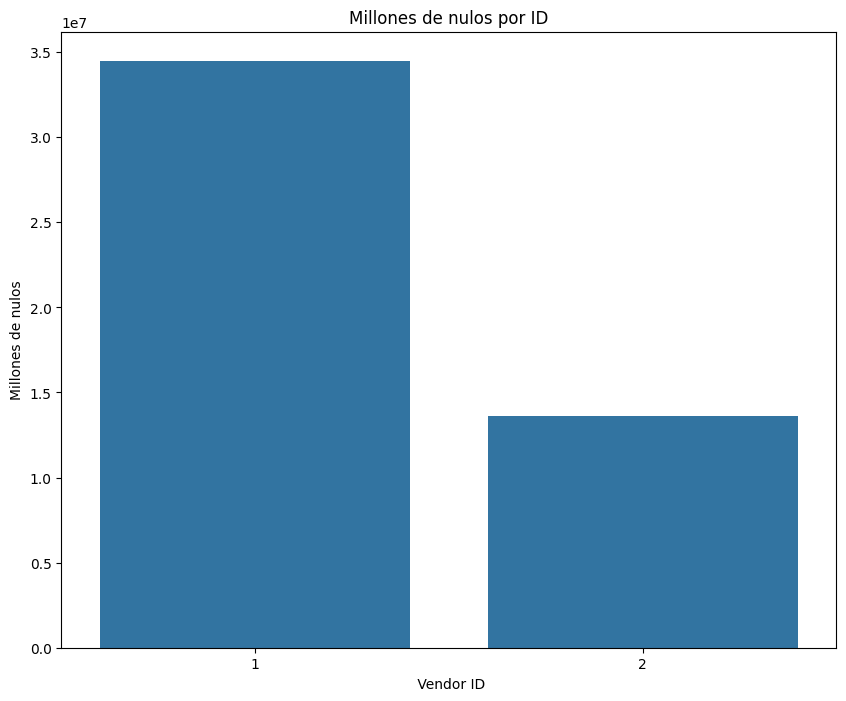

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x="VendorID", y="total_nulos", data=nulos_por_id)
plt.title("Millones de nulos por ID")
plt.xlabel(" Vendor ID")
plt.ylabel("Millones de nulos")
plt.show()

In [ ]:
# Eliminacion de valores incorrectos
informacion_completa = informacion_completa.query("VendorID != 6") # hay tantos nulos que lo sacamos
informacion_completa = informacion_completa.query("RatecodeID != 99") # opcion no valida

In [ ]:
# Correccion de valores incorrectos
informacion_completa.store_and_fwd_flag = informacion_completa.store_and_fwd_flag.fillna("Desconocido")
informacion_completa.store_and_fwd_flag = informacion_completa.store_and_fwd_flag.astype("category")

columnas_nulos = cantidad_de_nulos_columna[cantidad_de_nulos_columna > 0].drop("store_and_fwd_flag").index
informacion_completa.fillna(informacion_completa.loc[:,columnas_nulos].median(), inplace=True)

columnas = ["fare_amount", "extra", "mta_tax", "improvement_surcharge","tip_amount", "tolls_amount", "congestion_surcharge","airport_fee", "total_amount", "trip_distance", "passenger_count"]
mascara = (informacion_completa[columnas] >= 0).all(axis=1)

informacion_completa = informacion_completa.loc[mascara]

In [ ]:
# Valores cualitativos (categoricos)
variables_cualitativas = ["ViajeID","RatecodeID", "payment_type", "store_and_fwd_flag", "PULocationID", "DOLocationID", "VendorID", "tpep_pickup_datetime", "tpep_dropoff_datetime"]
informacion_cualitativa = informacion_completa.loc[:,variables_cualitativas]

In [ ]:
# Valores cuantitativos
variables_cuantitativas = ["ViajeID","passenger_count", "trip_distance", "fare_amount", "extra", "mta_tax", "improvement_surcharge","tip_amount","tolls_amount", "total_amount","congestion_surcharge", "airport_fee"]
informacion_cuantitativa = informacion_completa.loc[:,variables_cuantitativas]

In [ ]:
#creacion features
fecha_inicio = informacion_cualitativa["tpep_pickup_datetime"]
dias_habil = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]

informacion_cualitativa["meses"] = fecha_inicio.dt.month
informacion_cualitativa["dia_inicio"] = fecha_inicio.dt.day
informacion_cualitativa["dias_semana"] = fecha_inicio.dt.day_name()
informacion_cualitativa["hora_inicio"] = fecha_inicio.dt.hour
informacion_cualitativa["dia_habil"] = informacion_cualitativa["dias_semana"].isin(dias_habil)
informacion_cualitativa["diferencia_viaje"] = (informacion_cualitativa["tpep_dropoff_datetime"] - fecha_inicio)

In [ ]:
informacion_cualitativa = informacion_cualitativa.loc[(informacion_cualitativa["meses"] == 1) | (informacion_cualitativa["meses"] == 2) | (informacion_cualitativa["meses"] == 3)]

In [ ]:
mascara_bool = informacion_cualitativa["diferencia_viaje"] < timedelta(0)
informacion_cualitativa.loc[:,"duracion_viaje"] = informacion_cualitativa.loc[:,"diferencia_viaje"]
informacion_cualitativa.loc[mascara_bool, "duracion_viaje"] += timedelta(days=1)

In [ ]:
info = informacion_cualitativa.duracion_viaje.describe()
viaje_promedio = info["75%"] - info["25%"]
desvio_estandar = info["std"]
mean = info["mean"]
duraciones_viajes = informacion_cualitativa.duracion_viaje
viaje_cortos = duraciones_viajes < mean - viaje_promedio
viajes_largos = duraciones_viajes >= viaje_promedio + desvio_estandar

informacion_cualitativa.loc[:, "categoria_viaje"] = "Viaje promedio"
informacion_cualitativa.loc[viaje_cortos, "categoria_viaje"] = "viaje corto"
informacion_cualitativa.loc[viajes_largos, "categoria_viaje"] = "viaje largo"

In [ ]:
#eliminar columnas que ya no son necesarias
informacion_cualitativa.drop(columns = ["tpep_pickup_datetime", "diferencia_viaje", "duracion_viaje", "tpep_dropoff_datetime"], inplace = True)

In [ ]:
# Recategorizacion a tipos de datos mas chicos
informacion_cualitativa.categoria_viaje = informacion_cualitativa.categoria_viaje.astype("category")
informacion_cualitativa.dia_habil = informacion_cualitativa.dia_habil.astype("category")
informacion_cualitativa.meses = informacion_cualitativa.meses.astype("int8")
informacion_cualitativa.dias_semana = informacion_cualitativa.dias_semana.astype("category")
informacion_cualitativa.hora_inicio = informacion_cualitativa.hora_inicio.astype(np.int8)
informacion_cualitativa.dia_inicio = informacion_cualitativa.dia_inicio.astype(np.int8)


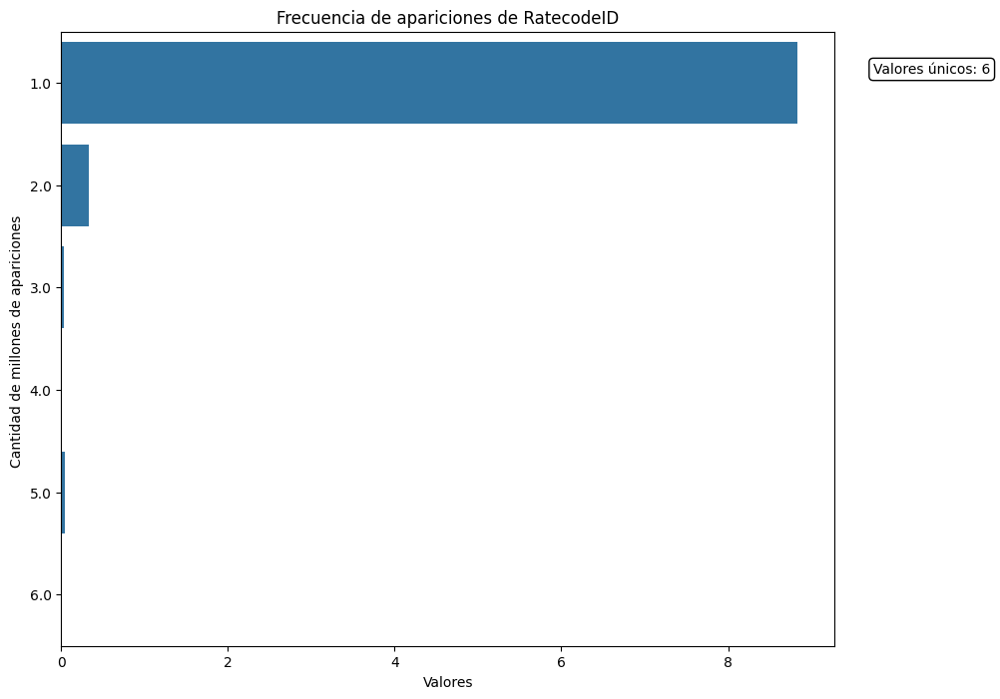

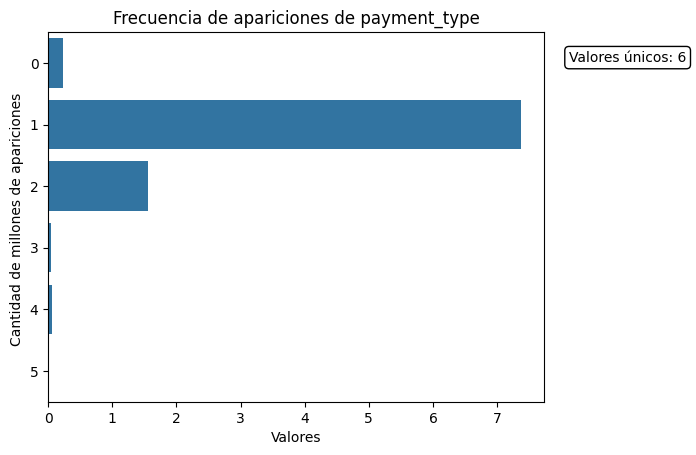

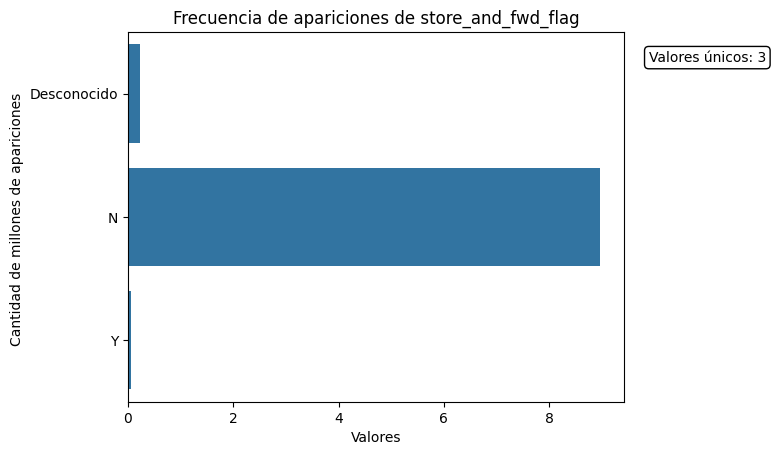

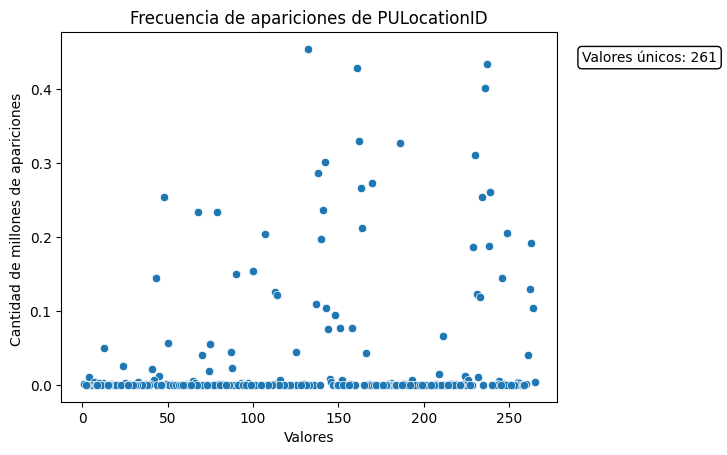

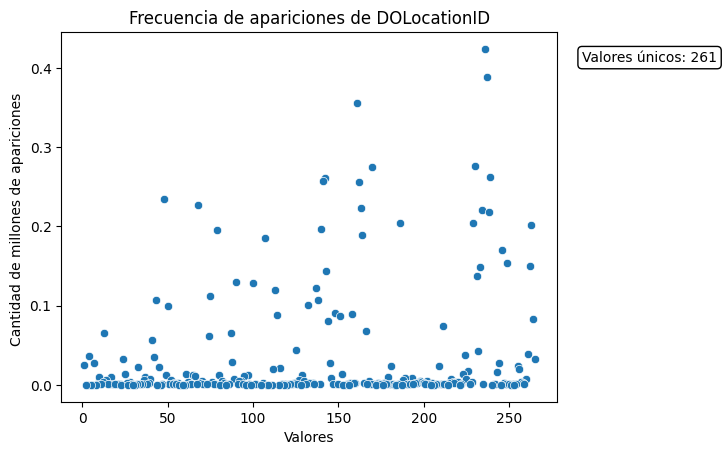

...

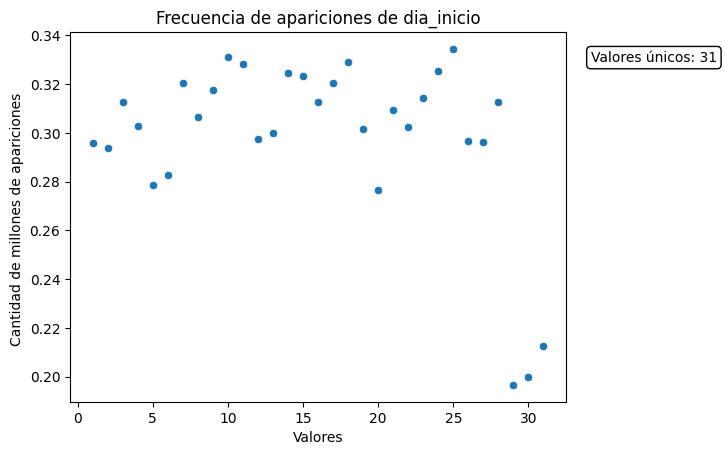

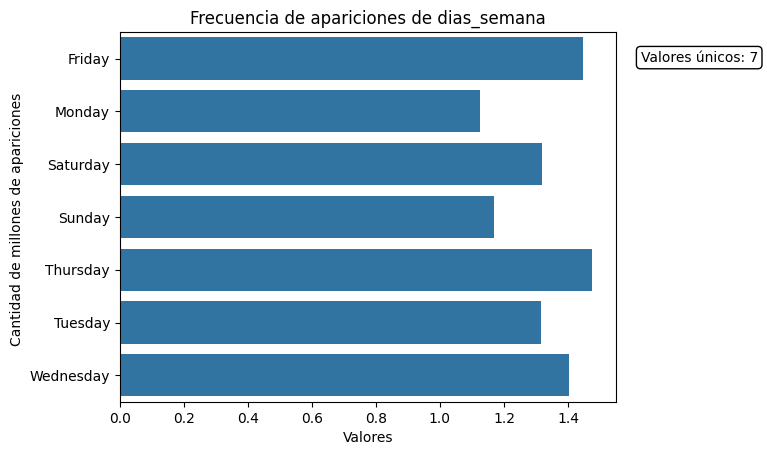

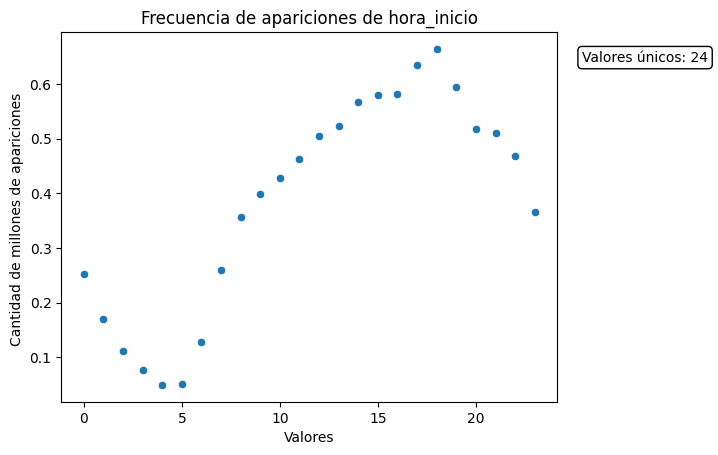

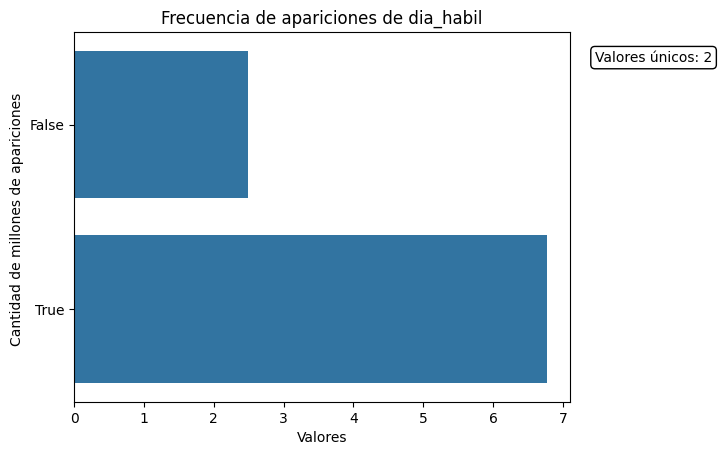

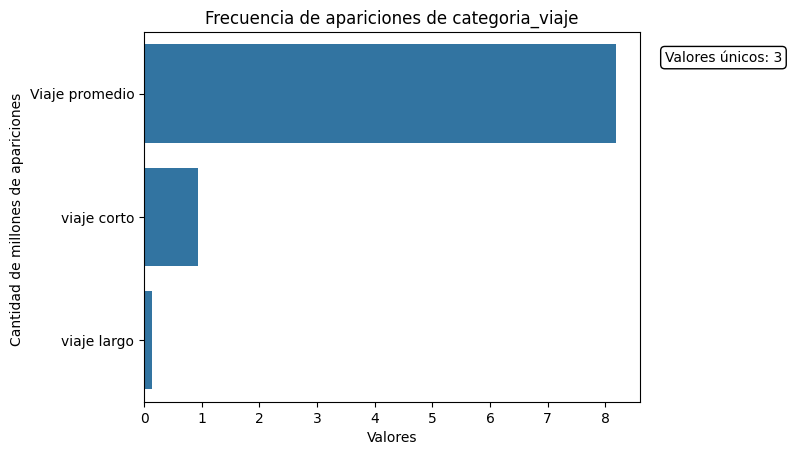

In [ ]:
# Variables Cualitativas: mostrar cantidad de valores posibles, y frecuencias de cada uno.

def mostrar_estadisticas_cualitativas(dataframe):

  plt.figure(figsize=(10, 8))
  for columna in dataframe.columns:

    frecuencias = dataframe[columna].value_counts()
    valores_unicos = len(frecuencias)
    if (columna != "ViajeID"):
      if (valores_unicos < 15):
        sns.barplot(x = frecuencias.values / 1e6, y = frecuencias.index, orient = "h")
      else:
        sns.scatterplot(x = frecuencias.index, y = frecuencias.values / 1e6)

      plt.title(f"Frecuencia de apariciones de {columna}")
      plt.xlabel("Valores")
      plt.ylabel("Cantidad de millones de apariciones ")
      plt.text(1.05, 0.95, f"Valores únicos: {valores_unicos}", transform = plt.gca().transAxes, fontsize = 10, verticalalignment = "top", bbox = dict(facecolor = "white", edgecolor = "black", boxstyle = "round"))
      plt.show()
      print("\n")

mostrar_estadisticas_cualitativas(informacion_cualitativa)

In [ ]:
def asignar_estadisticas_cuantitativas(dataframe):
    return pd.DataFrame({
        "media": dataframe.mean(),
        "mediana": dataframe.median(),
        "moda": dataframe.mode().iloc[0],
        "min": dataframe.min(),
        "max": dataframe.max()
    })

cuantitativa = asignar_estadisticas_cuantitativas(informacion_cuantitativa)
cuantitativa

,media,mediana,moda,min,max
ViajeID,1.570626e+06,1.563936e+06,0.000000,0.0,3.403765e+06
passenger_count,1.348537e+00,1.000000e+00,1.000000,0.0,9.000000e+00
trip_distance,3.864539e+00,1.790000e+00,1.000000,0.0,3.350043e+05
fare_amount,1.876126e+01,1.280000e+01,8.600000,0.0,2.203100e+03
extra,1.608343e+00,1.000000e+00,0.000000,0.0,2.080000e+01
mta_tax,4.962165e-01,5.000000e-01,0.500000,0.0,5.316000e+01
improvement_surcharge,9.986998e-01,1.000000e+00,1.000000,0.0,1.000000e+00
tip_amount,3.465922e+00,2.800000e+00,0.000000,0.0,9.843000e+02
tolls_amount,5.351208e-01,0.000000e+00,0.000000,0.0,1.969900e+02
total_amount,2.765620e+01,2.045000e+01,16.799999,0.0,2.208100e+03


In [ ]:
#Calculo la correlación
correlacion_cualitativa = informacion_cualitativa.corr(numeric_only=True)
correlacion_cuantitativa = informacion_cuantitativa.corr(numeric_only=True)

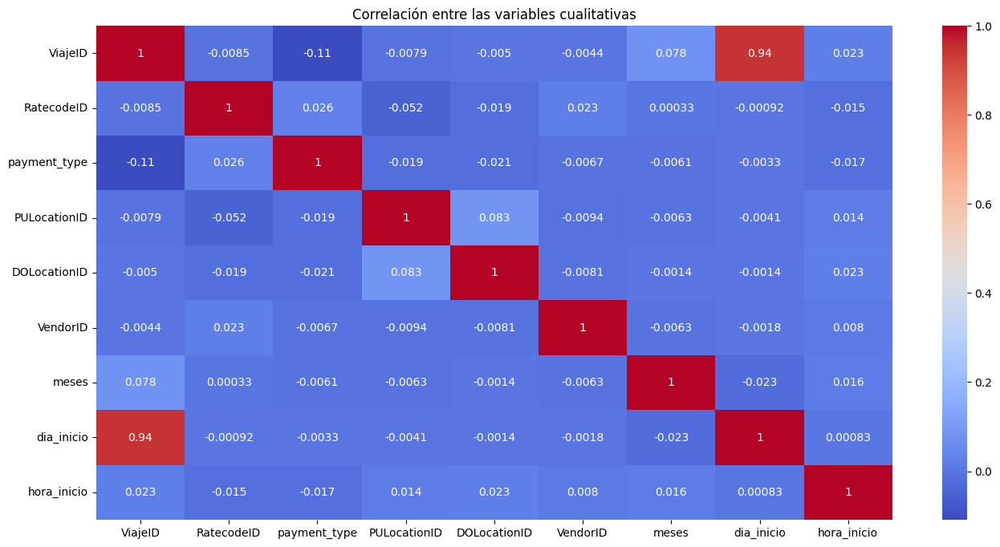

In [ ]:
plt.figure(figsize=(16,8))
sns.heatmap(correlacion_cualitativa, annot = True, cmap='coolwarm')
plt.title('Correlación entre las variables cualitativas')
plt.show()

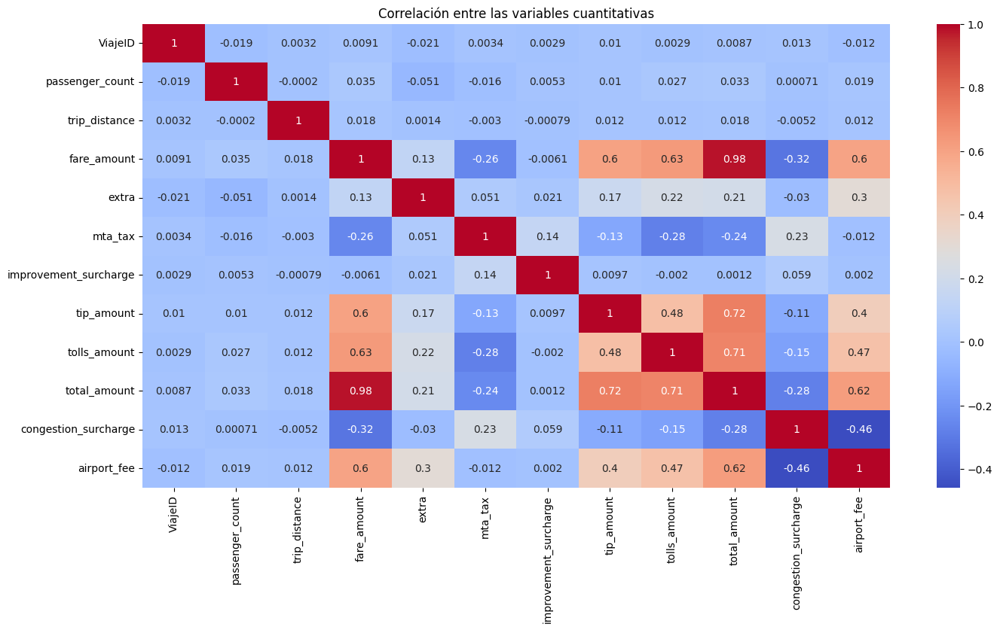

In [ ]:
plt.figure(figsize=(16,8))
sns.heatmap(correlacion_cuantitativa, annot = True, cmap='coolwarm')
plt.title('Correlación entre las variables cuantitativas')
plt.show()

#analisis outlier se usa el 10% de los df

In [ ]:
#outliers #analisis univariado

def detectar_outliers(serie):

  primer_cuartil = np.quantile(serie, 0.25)
  tercer_cuartil = np.quantile(serie,0.75)
  valores_esperados = tercer_cuartil - primer_cuartil

  limite_superior = tercer_cuartil + (1.5 * valores_esperados)
  limite_inferior = primer_cuartil - (1.5 * valores_esperados)


  return (serie > limite_superior) | (serie < limite_inferior)

In [ ]:
informacion_numerica_cuantitativa = informacion_cuantitativa.drop(columns=["ViajeID"])
outliers_cuantitativas = informacion_numerica_cuantitativa.apply(detectar_outliers)
outliers_cuantitativas = outliers_cuantitativas.sum().sort_values(ascending=False)
outliers_cuantitativas

,0
passenger_count,2180362
trip_distance,1180013
total_amount,1052041
fare_amount,977781
airport_fee,763220
tolls_amount,693566
tip_amount,677115
congestion_surcharge,624502
extra,143459
mta_tax,72219


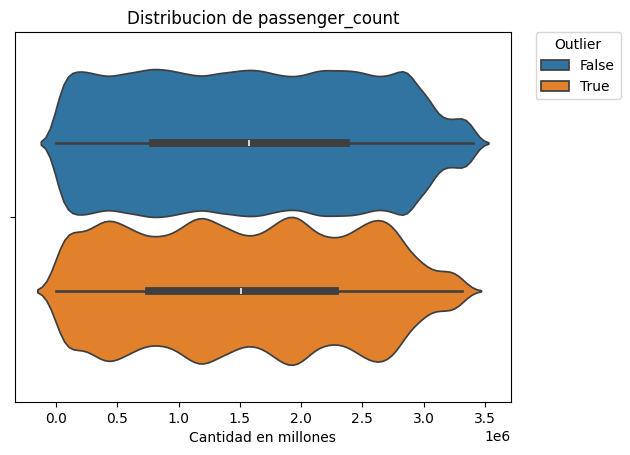

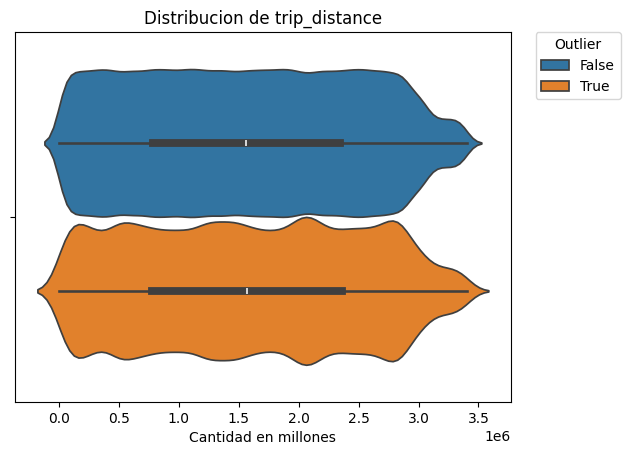

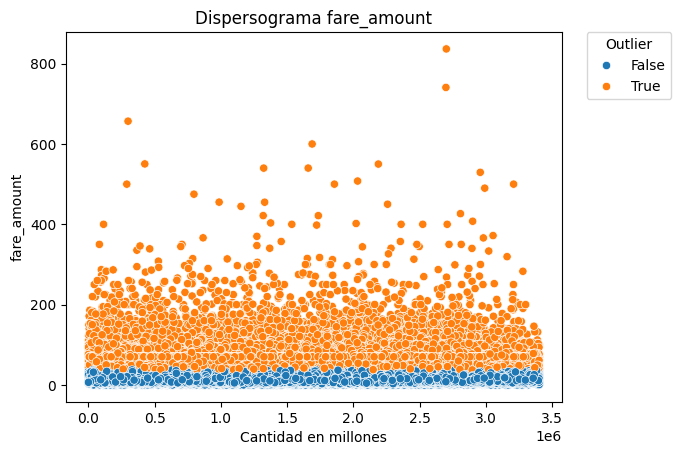

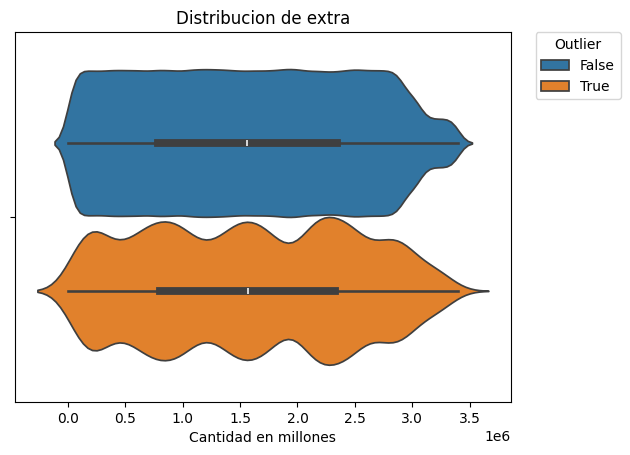

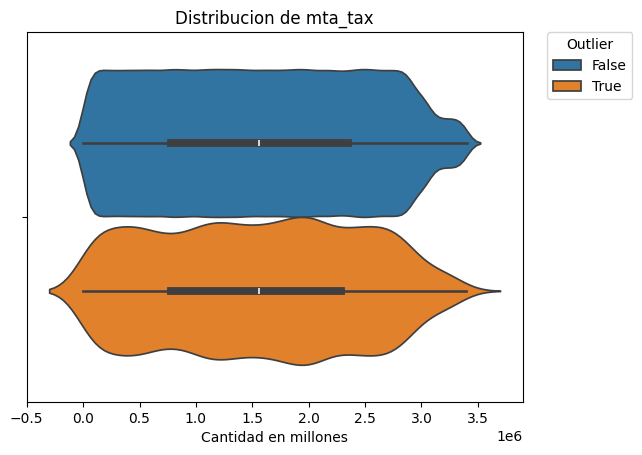

...

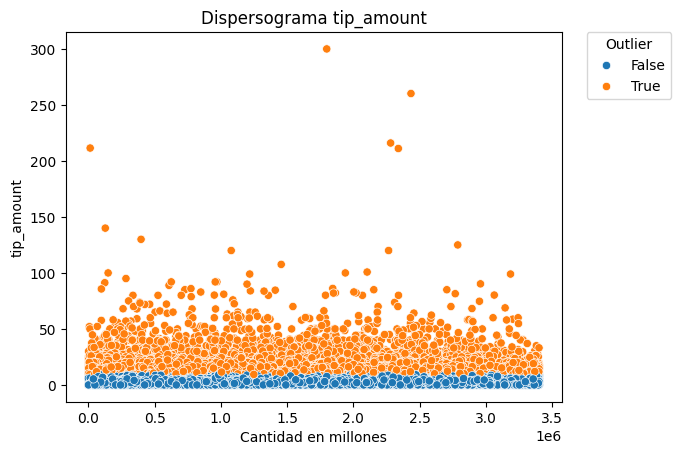

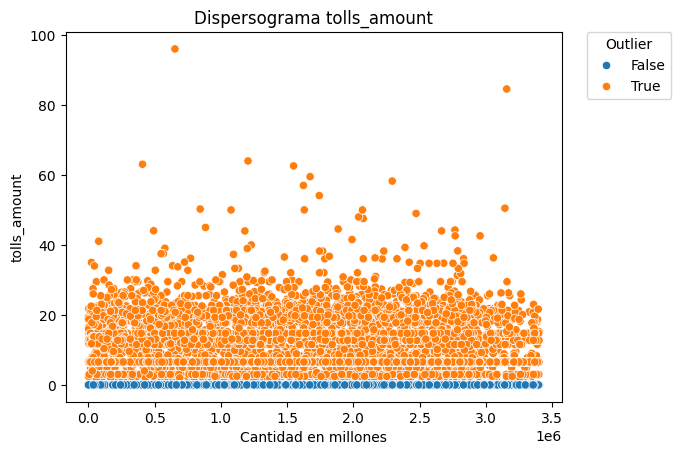

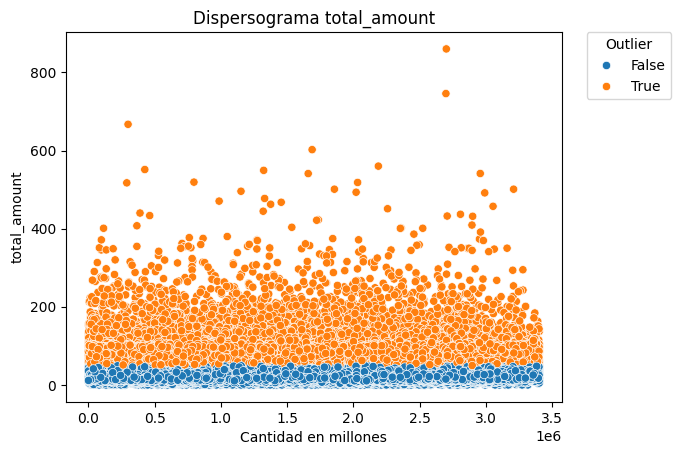

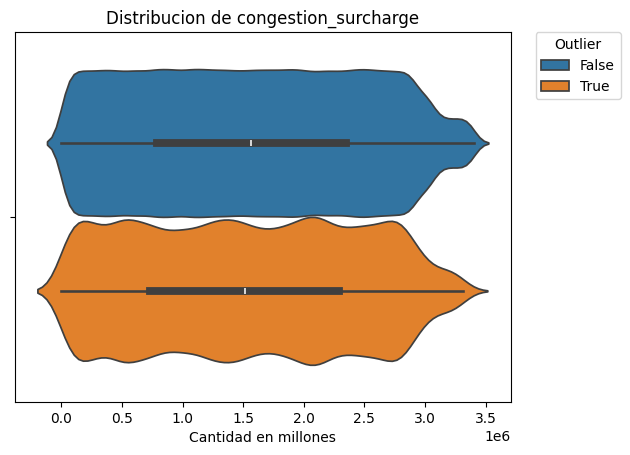

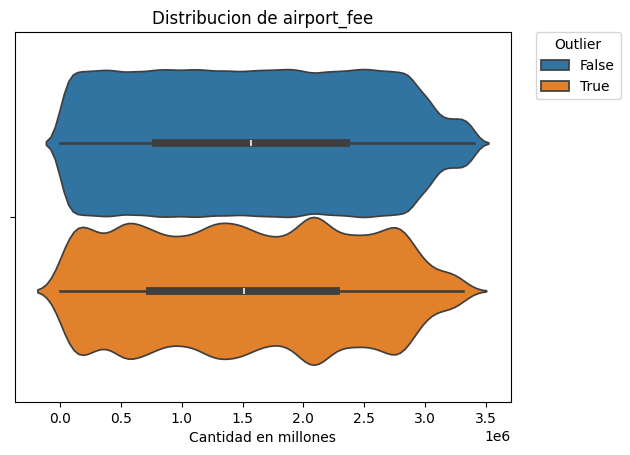

In [ ]:
def mostrar_outliers(df):

  for columna in df.columns:
    serie = df[columna]
    umbral = detectar_outliers(serie)
    outliers = serie[umbral]
    eje_x = serie.index

    if ("amount" in columna):
      sns.scatterplot(x=eje_x, y=serie, hue= umbral)
      plt.title(f"Dispersograma {serie.name}")
      plt.ylabel(serie.name)
    else:
      sns.violinplot(x=eje_x, hue= umbral)
      plt.title(f"Distribucion de {serie.name}")

    plt.xlabel("Cantidad en millones")
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, title="Outlier")
    plt.show()
    print("\n")

sample_cuantitativo = informacion_numerica_cuantitativa.sample(frac=0.1, random_state=1)
mostrar_outliers(sample_cuantitativo)

In [ ]:
# distancia para analisis multivariado
def calculate_mahalanobis_distance(dataset, col1, col2, frac=1):

    X = dataset[[f'{col1}', f'{col2}']].copy()
    sample_X = X.sample(frac=frac)

    promedio = sample_X.mean()
    X_diff = X - promedio
    X_diff = X_diff.values.T

    cov = np.cov(sample_X.values.T)
    inv_cov = np.linalg.inv(cov)
    W = la.sqrtm(inv_cov)

    Wx = np.matmul(W, X_diff)


    X['mahalanobis'] = [np.dot(Wx[:, i], Wx[:, i]) for i in range(Wx.shape[1])]

    return X

In [ ]:
def mostrar_outliers(dataset, serie1, serie2):
  umbral = dataset.mahalanobis.mean() + 3 * dataset.mahalanobis.std()
  es_outlier = (dataset["mahalanobis"] > umbral)

  sns.scatterplot(x = serie1, y = serie2, hue = es_outlier)
  plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, title="Outlier")
  plt.title(f"Dispersograma {serie1.name} vs {serie2.name}")
  plt.show()

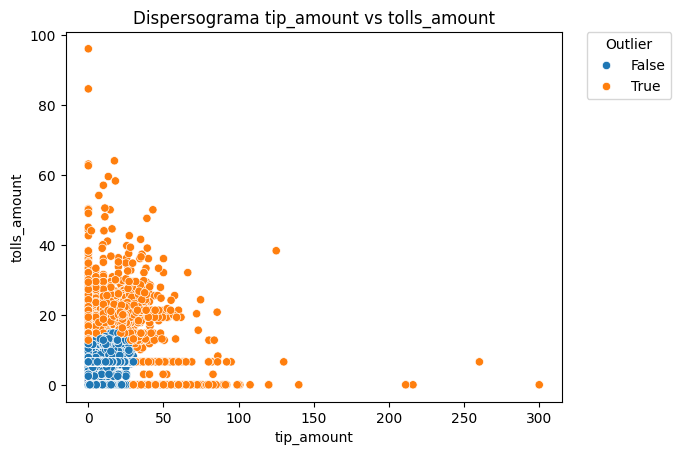

In [ ]:
sample_cuantitiativa = informacion_cuantitativa.sample(frac=0.1, random_state=1)

tip_tolls = calculate_mahalanobis_distance(sample_cuantitiativa, "tip_amount", "tolls_amount")
mostrar_outliers(tip_tolls, tip_tolls.tip_amount, tip_tolls.tolls_amount)

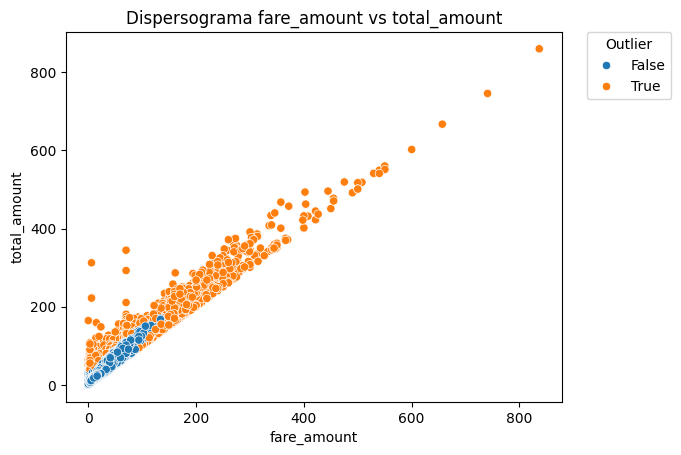

In [ ]:
distancia_tarifa_monto = calculate_mahalanobis_distance(sample_cuantitiativa, "fare_amount", "total_amount")
mostrar_outliers(distancia_tarifa_monto, distancia_tarifa_monto.fare_amount, distancia_tarifa_monto.total_amount)


In [ ]:
meses = ["Enero", "Febrero", "Marzo"]
informacion_cualitativa.loc[:, "meses"] = informacion_cualitativa.loc[:, "meses"].map({1: meses[0], 2: meses[1], 3: meses[2]})

In [ ]:
#mapear cada tipo de pago a su categoria

def categorizar_tipo_pago(tipo_pago):
    if tipo_pago == 1:
        return "Tarjeta de credito"
    elif tipo_pago == 2:
        return "Efectivo"
    elif tipo_pago == 3:
        return "Sin cargo"
    elif tipo_pago == 4:
      return "Disputa"
    elif tipo_pago == 5:
      return "Desconocido"
    return "Viaje anulado"

informacion_cualitativa.loc[:, "payment_type"] = informacion_cualitativa.loc[:, "payment_type"].map(categorizar_tipo_pago).astype("category")

In [ ]:
# Categorizar por cantidad de pasajeros: Pocos / Normal / Muchos
info_pasajeros = informacion_cuantitativa.passenger_count
media = info_pasajeros.mean()
desvio_estandar = info_pasajeros.std()
muchos = info_pasajeros > (media + desvio_estandar)
pocos = info_pasajeros < (media - desvio_estandar)

informacion_cuantitativa.loc[:, "categoria_pasajeros"] = "normal"
informacion_cuantitativa.loc[muchos, "categoria_pasajeros"] = "muchos"
informacion_cuantitativa.loc[pocos, "categoria_pasajeros"] = "pocos"


In [ ]:
# Creacion de franjas horarias

hora = informacion_cualitativa['hora_inicio']
madrugada = (hora >= 0) & (hora < 6)
tarde = (hora > 12) & (hora < 18)
noche = (hora >= 18) & (hora <= 23)

informacion_cualitativa.loc[:, "franja_horaria_inicio"] = "Mañana"
informacion_cualitativa.loc[madrugada, "franja_horaria_inicio"] = "Madrugada"
informacion_cualitativa.loc[tarde, "franja_horaria_inicio"] = "Tarde"
informacion_cualitativa.loc[noche, "franja_horaria_inicio"] = "Noche"

In [ ]:
# Creacion de quincenas
def calcular_quincena(valor):
  if valor >= 1 and valor <= 15:
    return "1er quincena"
  return "2da quincena"

informacion_cualitativa["quincena_inicio"] = informacion_cualitativa["dia_inicio"].map(calcular_quincena)
informacion_cualitativa.franja_horaria_inicio = informacion_cualitativa.franja_horaria_inicio.astype("category")
informacion_cualitativa.quincena_inicio = informacion_cualitativa.quincena_inicio.astype("category")

In [ ]:
# Correccion de valores incorrectos
informacion_zonas.fillna("No ingresado", inplace=True)

# Mapear id a estados
informacion_zonas.reset_index(inplace=True)
viajes_ubicacion_tiempo = informacion_cualitativa.loc[:, ["ViajeID", "meses","PULocationID", "DOLocationID", "dia_habil", "franja_horaria_inicio",  "quincena_inicio"]]
informacion_zonas.set_index("LocationID", inplace= True)
pull_info = viajes_ubicacion_tiempo.join(informacion_zonas, on="PULocationID", how="left")
pull_info.rename(columns={"Borough": "distrito_inicio", "Zone": "zonas_inicio", "service_zone": "service_zone_pickup"}, inplace=True)
pull_info.set_index("DOLocationID", inplace=True)

In [ ]:
pull_info.drop(columns=["index"],inplace=True)

In [ ]:
trayectos = pull_info.join(informacion_zonas, on="DOLocationID", how="left")
trayectos.rename(columns={"Borough": "distrito_fin", "Zone": "zona_fin", "service_zone": "service_zone_dropoff"}, inplace=True)

In [ ]:
trayectos.drop(columns=["index"],inplace=True)

# Preguntas de investigacion

¿Qué distritos solicitaron la mayor cantidad de viajes por quincena?


In [ ]:
viajes_por_quincena = trayectos.groupby(["quincena_inicio", "meses","distrito_inicio"],observed=False).size()
viajes_por_quincena = viajes_por_quincena.reset_index(name="cantidad_viajes")
viajes_por_quincena.sort_values(by="cantidad_viajes", ascending=False)

enero = viajes_por_quincena.query("meses == 'Enero'").sort_values(by="cantidad_viajes", ascending=False).nlargest(4, columns = "cantidad_viajes")
febrero = viajes_por_quincena.query("meses == 'Febrero'").sort_values(by="cantidad_viajes", ascending=False).nlargest(4, columns = "cantidad_viajes")
marzo = viajes_por_quincena.query("meses == 'Marzo'").sort_values(by="cantidad_viajes", ascending=False).nlargest(4, columns = "cantidad_viajes")

def graficar_viajes_por_quincena(df):
  sns.barplot(x = df.quincena_inicio, y = df.cantidad_viajes / 1e6, hue = df.distrito_inicio)
  plt.title(f"Cantidad de viajes por distrito segun quincena del mes {df.meses.iloc[0]}")
  plt.xlabel("Quincena")
  plt.legend(loc="upper right")
  plt.ylabel("Cantidad de viajes (en millones)")
  plt.show()

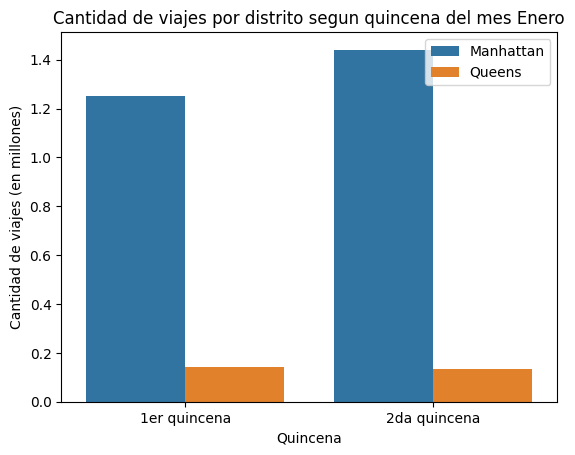

In [ ]:
graficar_viajes_por_quincena(enero)

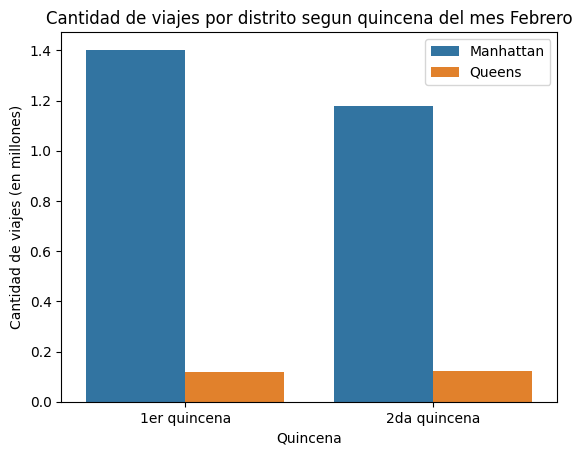

In [ ]:
graficar_viajes_por_quincena(febrero)

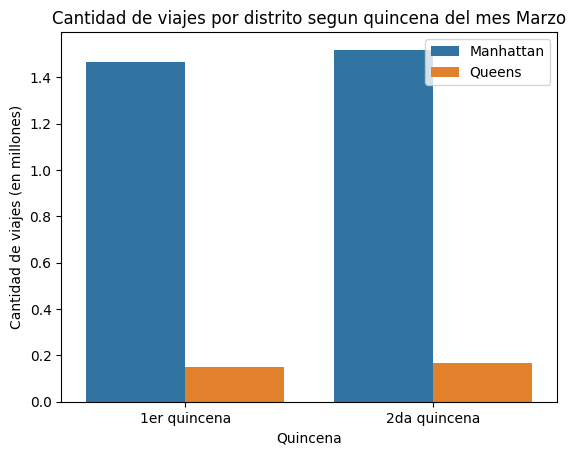

In [ ]:
graficar_viajes_por_quincena(marzo)

¿Cuál es la zona con mayor cantidad de viajes en el fin de semana?


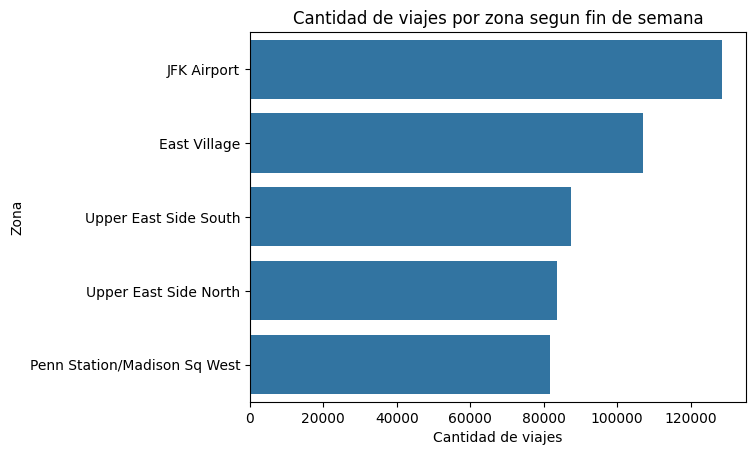

In [ ]:
viajes_finde = trayectos.groupby(["zonas_inicio", "dia_habil"],observed=False).size()
viajes_finde = viajes_finde.reset_index(name="cantidad_viajes")
viajes_finde = viajes_finde[viajes_finde["dia_habil"] == False].nlargest(5, columns = "cantidad_viajes")

sns.barplot(y = viajes_finde.zonas_inicio, x = viajes_finde.cantidad_viajes, orient="h")

plt.title("Cantidad de viajes por zona segun fin de semana")
plt.xlabel("Cantidad de viajes")
plt.ylabel("Zona")
plt.show()

¿Cuál es la cantidad de viajes en cada franja horaria, en cada distrito?

In [ ]:
franjas_horas_distritos = trayectos.loc[:,["ViajeID", "franja_horaria_inicio" , "distrito_fin"]].dropna()
franjas_horas_distritos = franjas_horas_distritos.loc[franjas_horas_distritos["distrito_fin"] != "Unknown"]
id_vendedor = informacion_cualitativa.loc[:, ["VendorID", "ViajeID"]]
franjas_horas_distritos.set_index("ViajeID", inplace=True)
id_vendedor.set_index("ViajeID", inplace=True)

viaje_distritos_horario = id_vendedor.merge(franjas_horas_distritos, on="ViajeID", how="inner")

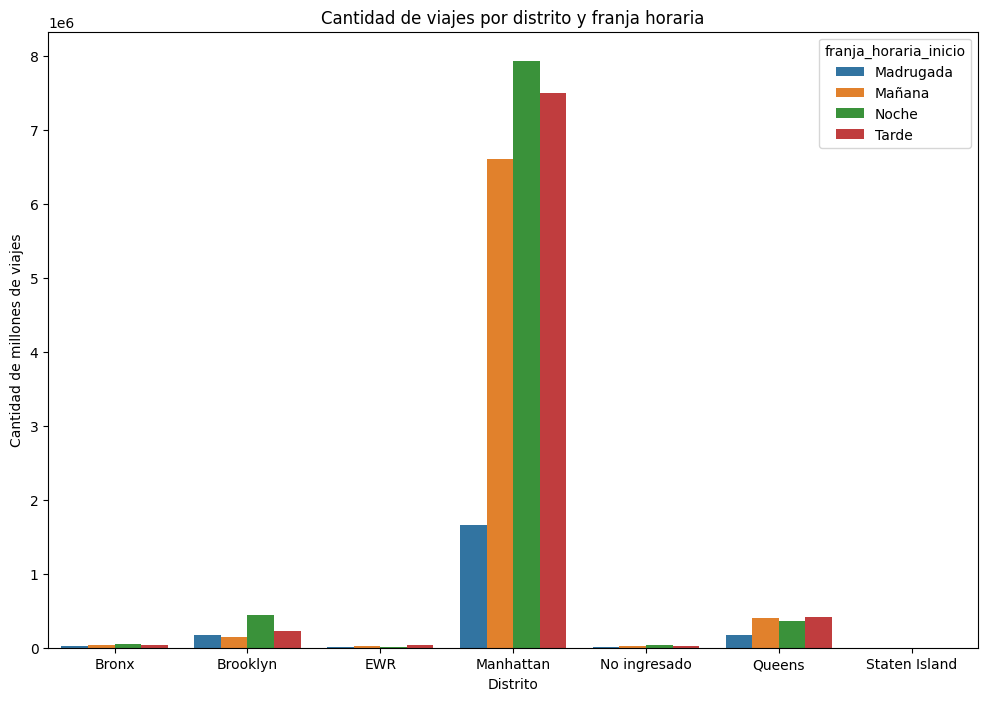

In [ ]:
viajes_distritos_horario = viaje_distritos_horario.groupby(["distrito_fin", "franja_horaria_inicio"],observed=False).size()
viajes_distritos_horario = viajes_distritos_horario.reset_index(name="cantidad_viajes")

plt.figure(figsize=(12, 8))
sns.barplot(x="distrito_fin", y="cantidad_viajes", hue="franja_horaria_inicio", data=viajes_distritos_horario, errorbar=None)
plt.title("Cantidad de viajes por distrito y franja horaria")
plt.xlabel("Distrito")
plt.ylabel("Cantidad de millones de viajes")
plt.show()

¿Cuál es la distribución de la cantidad de pasajeros en un día?

In [ ]:
horas = informacion_cualitativa.loc[:,["ViajeID", "hora_inicio"]]
pasajeros = informacion_cuantitativa.loc[:, ["ViajeID", "passenger_count"]]
horas.set_index("ViajeID", inplace=True)
pasajeros.set_index("ViajeID", inplace=True)

pasajeros_horas = pasajeros.merge(horas, on="ViajeID", how="inner")

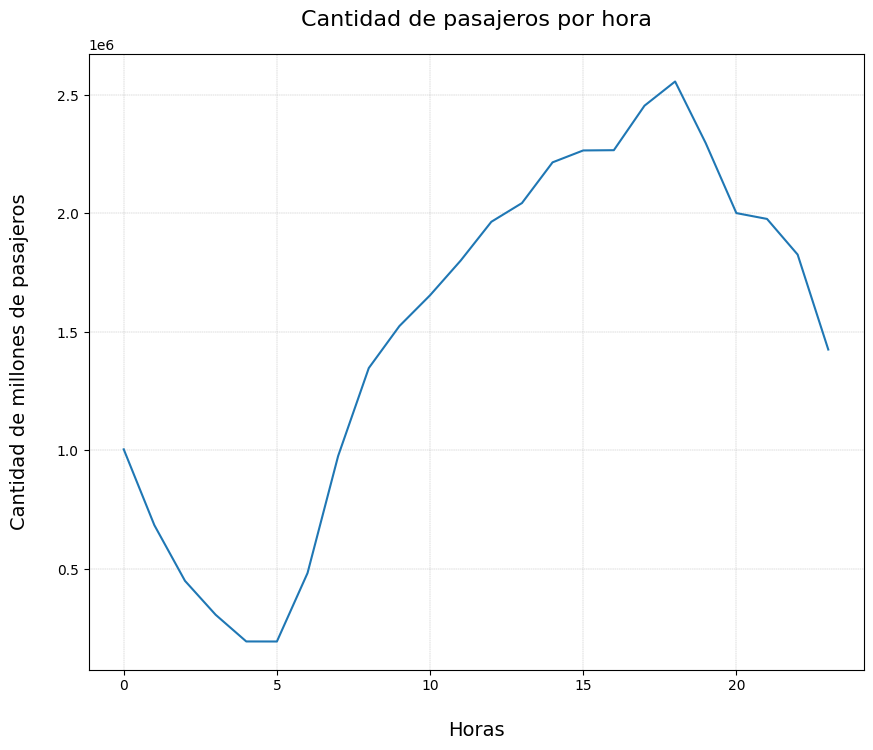

In [ ]:
pasajeros_horas = pasajeros_horas.groupby("hora_inicio").agg({"passenger_count": "sum"})
plt.figure(figsize=(10, 8))
sns.lineplot(x = "hora_inicio", y = "passenger_count", data = pasajeros_horas)
plt.title("Cantidad de pasajeros por hora", fontsize=16, pad=20)
plt.xlabel("Horas", fontsize=14, labelpad=20)
plt.ylabel("Cantidad de millones de pasajeros", fontsize=14, labelpad=20)

plt.grid(True, which='both', linestyle='--', linewidth=0.3)
plt.show()

¿Se deja más propina, en promedio, en los días hábiles o los fines de semana?


In [ ]:
propina = informacion_cuantitativa.loc[:, ["ViajeID", "tip_amount"]]
franja_habil = informacion_cualitativa.loc[:, ["ViajeID", "dia_habil"]]
propina.set_index("ViajeID", inplace=True)
franja_habil.set_index("ViajeID", inplace=True)

propina_franja_habil = franja_habil.merge(propina, on="ViajeID", how="inner")

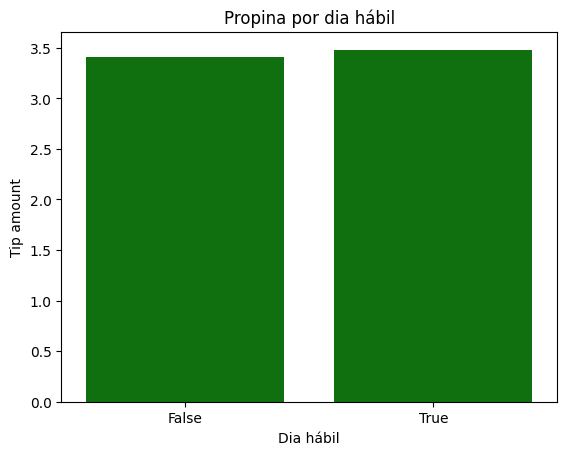

In [ ]:
propina_franja_habil = propina_franja_habil.groupby("dia_habil",observed=False).agg({"tip_amount": "mean"})
propina_franja_habil = propina_franja_habil.reset_index()
propina_franja_habil
sns.barplot(x = "dia_habil", y = "tip_amount", data = propina_franja_habil, color="green")
plt.title("Propina por dia hábil")
plt.xlabel("Dia hábil")
plt.ylabel("Tip amount")
plt.show()

¿Cuál es la quincena de cada mes en la que hay más congestión?

In [ ]:
congestion = informacion_cuantitativa.loc[:, ["ViajeID", "congestion_surcharge"]]
quincena_meses = informacion_cualitativa.loc[:, ["ViajeID", "quincena_inicio", "meses"]]
congestion.set_index("ViajeID", inplace=True)
quincena_meses.set_index("ViajeID", inplace=True)

congestion_quincena = quincena_meses.merge(congestion, on="ViajeID", how="inner")

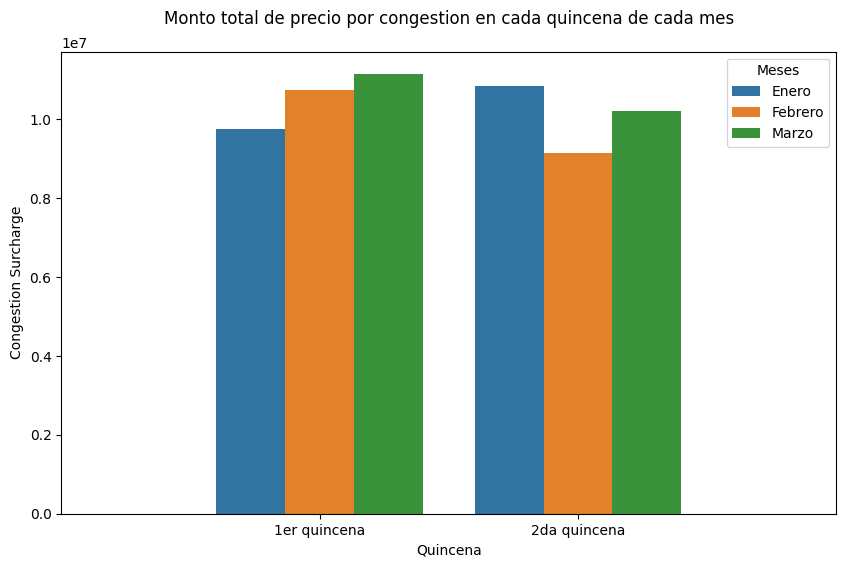

In [ ]:
congestion_quincena = congestion_quincena.groupby(["meses", "quincena_inicio"],observed=False).agg({"congestion_surcharge": "sum"})
congestion_quincena.reset_index(inplace=True)
plt.figure(figsize=(10, 6))
sns.barplot(x = "quincena_inicio", y = "congestion_surcharge", hue = "meses", data = congestion_quincena)
plt.title("Monto total de precio por congestion en cada quincena de cada mes", pad = 20)
plt.xlabel("Quincena")
plt.xlim(-1,2)
plt.ylabel("Congestion Surcharge")
plt.legend(title="Meses")
plt.show()


¿Cuántos pasajeros suelen abordar un taxi cuando parte del aeropuerto?

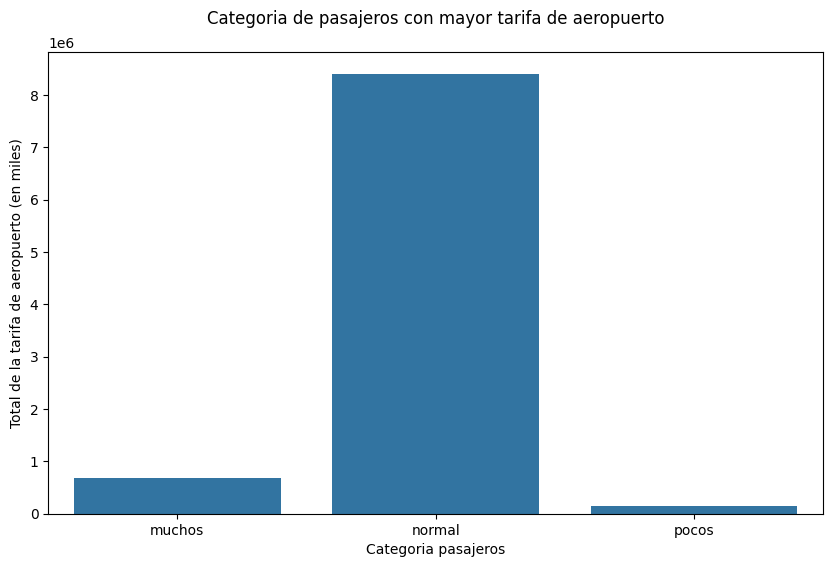

In [ ]:
pasajeros_aeropuerto = informacion_cuantitativa.loc[:, ["categoria_pasajeros", "airport_fee"]]
pasajeros_aeropuerto = pasajeros_aeropuerto.groupby("categoria_pasajeros").agg({"airport_fee": "count" })

plt.figure(figsize=(10, 6))
sns.barplot(x = "categoria_pasajeros", y = "airport_fee", data = pasajeros_aeropuerto)
plt.title("Categoria de pasajeros con mayor tarifa de aeropuerto", pad = 20)
plt.xlabel("Categoria pasajeros")
plt.ylabel("Total de la tarifa de aeropuerto (en miles)")
plt.show()

¿Cuál es el promedio de extras según el tipo de pago?

In [ ]:
tipo_de_pago = informacion_cualitativa.loc[:, ["ViajeID", "payment_type"]]
extras = informacion_cuantitativa.loc[:, ["ViajeID", "extra"]]

extras_segun_tipo_pago = tipo_de_pago.merge(extras, on="ViajeID", how="inner")

In [ ]:
extras_segun_tipo_pago = extras_segun_tipo_pago.groupby("payment_type",observed=False).agg({"extra": "mean"})
extras_segun_tipo_pago = extras_segun_tipo_pago.reset_index()
pie = px.pie(extras_segun_tipo_pago, values="extra", names="payment_type")
pie.update_layout(title={"text": "Promedio de extras por tipo de pago", "x": 0.48})
pie.show()

¿En qué horas presenta más viajes cada VendorID y en qué mes?

In [ ]:
code_hora_mes = informacion_cualitativa.loc[:, ["VendorID", "meses", "hora_inicio"]]
sample_hora = code_hora_mes.sample(frac=0.1, random_state=1)
box = px.box(sample_hora, x="meses", y="hora_inicio", color="VendorID")
box.update_layout(title={"text": "Distribución de horas en cada mes segun VendorID", "x": 0.48})
box.show()

# Visualización de los datos

In [ ]:
trayectos.reset_index(inplace=True)

In [ ]:
informacion_cualitativa_sin_ids = informacion_cualitativa.drop(columns=["ViajeID","VendorID","RatecodeID", "PULocationID", "DOLocationID"])

trayectos_sin_ids = trayectos.drop(columns=["DOLocationID", "ViajeID", "PULocationID"])

filtrar_desconocidos = "distrito_fin != 'Unknown' & distrito_inicio != 'Unknown' & distrito_fin != 'No ingresado' & distrito_inicio != 'No ingresado'"
trayectos_sin_ids = trayectos_sin_ids.query(filtrar_desconocidos)
informacion_cuantitativa_sin_ids = informacion_cuantitativa.drop(columns=["ViajeID"])

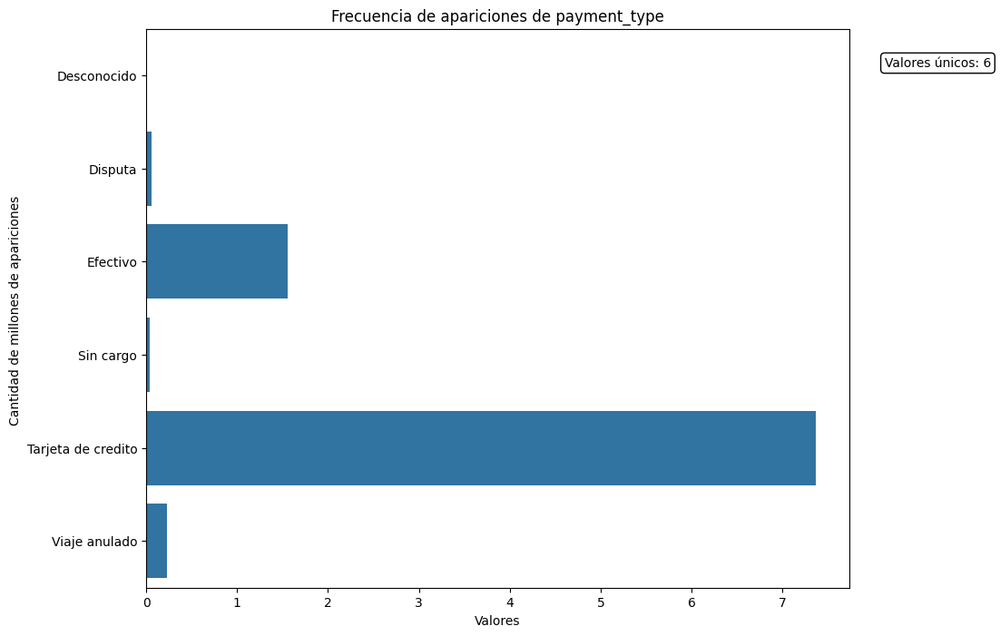

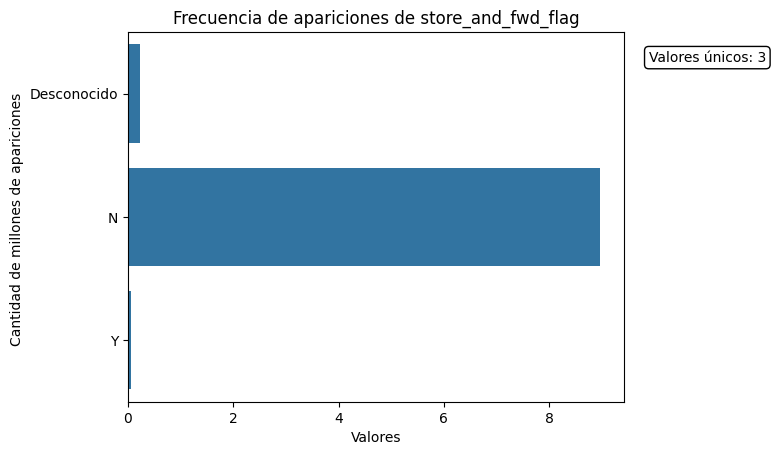

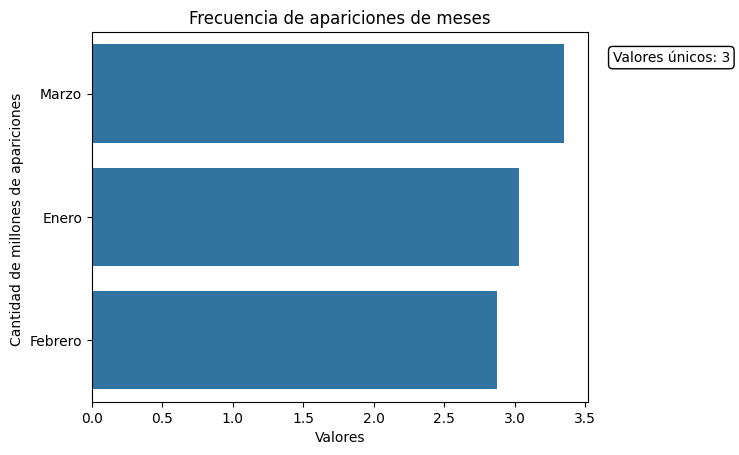

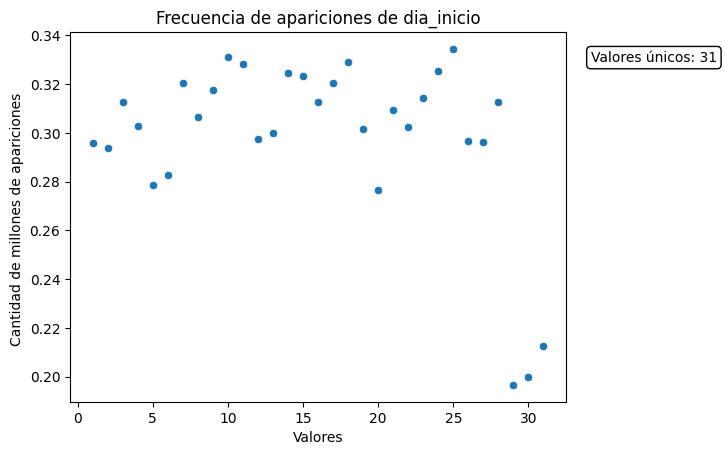

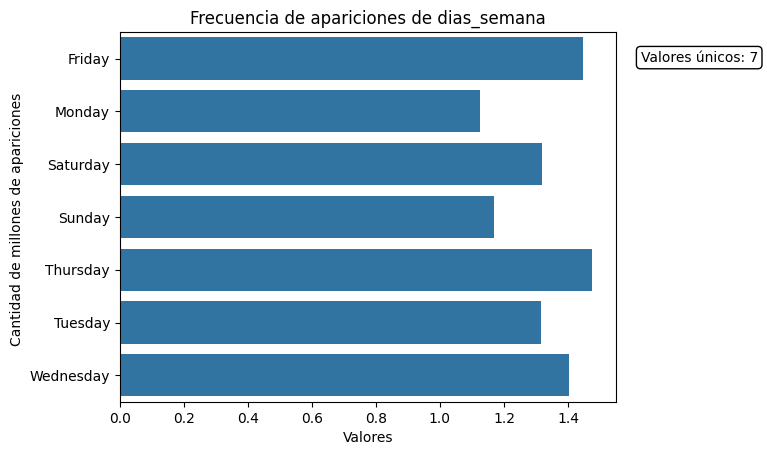

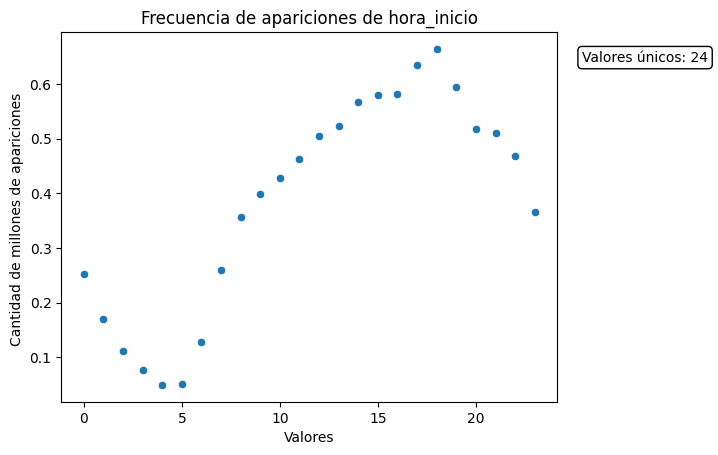

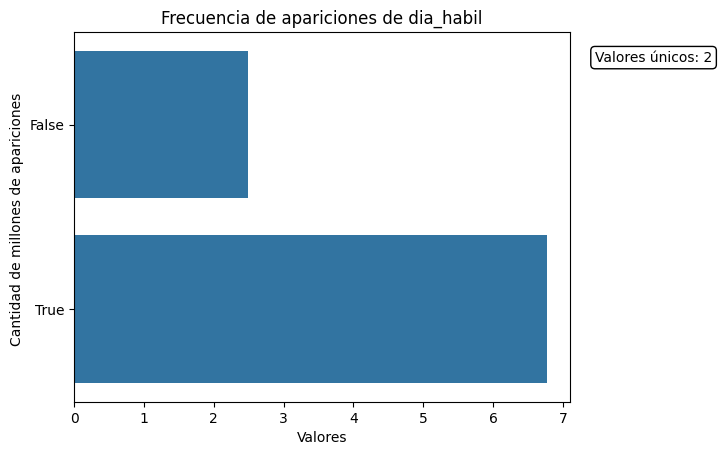

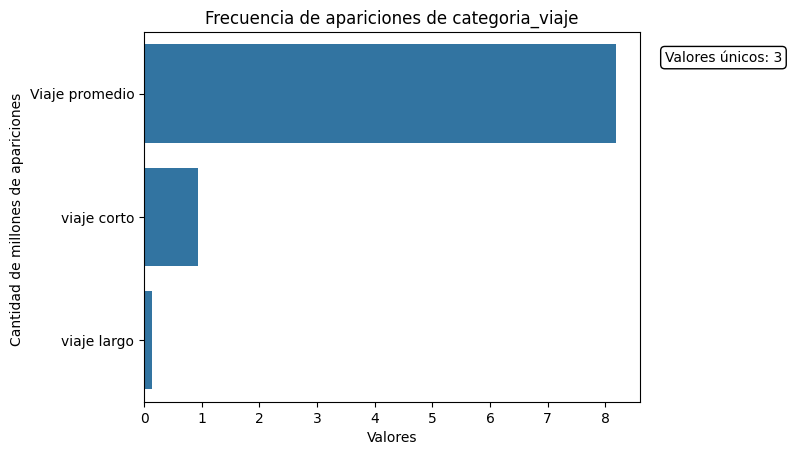

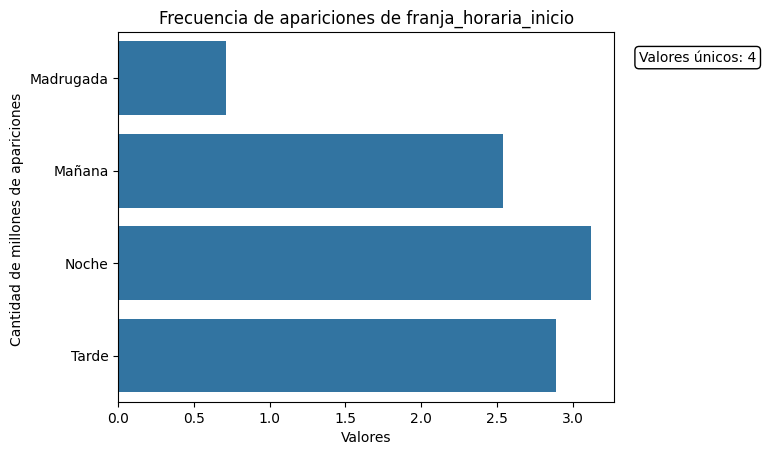

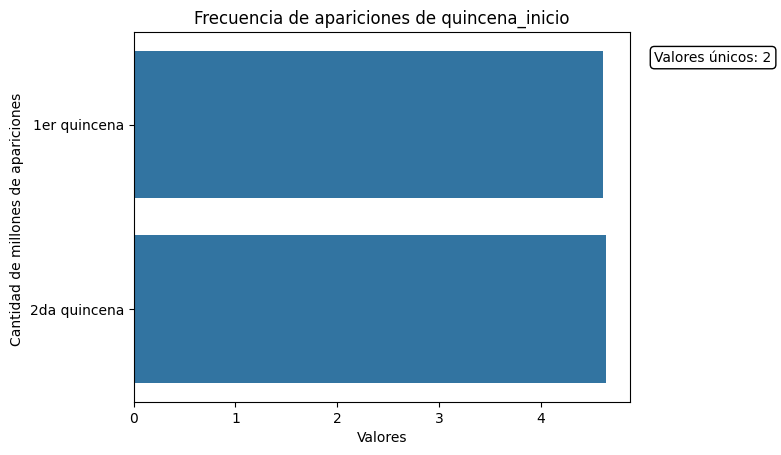

In [ ]:
mostrar_estadisticas_cualitativas(informacion_cualitativa_sin_ids)

In [ ]:
def graficar_trayectos(df):

  fig = px.treemap(df, path=['distrito_inicio', 'zonas_inicio', 'service_zone_pickup'], title='Interrelacion entre distritos, zonas y servicios donde se subio el pasajero')
  fig.show()

  print("\n")
  fig = px.treemap(df, path=['distrito_fin', 'zona_fin', 'service_zone_dropoff'], title='Interrelacion entre distritos, zonas y servicios donde se bajo el pasajero')
  fig.show()

trayectos_sin_ids = trayectos_sin_ids.loc[:, ["distrito_inicio", "zonas_inicio", "service_zone_pickup", "distrito_fin", "zona_fin", "service_zone_dropoff"]]

sample_trayectos = trayectos_sin_ids.sample(frac=0.1, random_state=1)
graficar_trayectos(trayectos_sin_ids)